In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.axes as ax

In [65]:
data = pd.read_csv('data_for_lr.csv')

# Drop the missing values
data = data.dropna()

# training dataset and labels
train_input = [2.0,6.0,5.0,7.0]
train_output = [3.0,10.0,4.0,3.0]

# valid dataset and labels
test_input = np.array(data.x[500:700]).reshape(199,1)
test_output = np.array(data.y[500:700]).reshape(199,1)
# # training dataset and labels
# train_input = np.array(data.x[0:500]).reshape(500,1)
# train_output = np.array(data.y[0:500]).reshape(500,1)

# # valid dataset and labels
# test_input = np.array(data.x[500:700]).reshape(199,1)
# test_output = np.array(data.y[500:700]).reshape(199,1)


In [66]:
class LinearRegression:
	def __init__(self):
		self.parameters = {}
	
	def forward_propagation(self, train_input):
		m = self.parameters['m']
		c = self.parameters['c']
		predictions = np.multiply(m, train_input) + c
		print(predictions)
		return predictions

	def cost_function(self, predictions, train_output):
		cost = np.mean((train_output - predictions) ** 2)
		return cost

	def backward_propagation(self, train_input, train_output, predictions):
		derivatives = {}
		df = (train_output - predictions) * -1
		dm = np.mean(np.multiply(train_input, df))
		dc = np.mean(df)
		derivatives['dm'] = dm
		derivatives['dc'] = dc
		return derivatives

	def update_parameters(self, derivatives, learning_rate):
		self.parameters['m'] = self.parameters['m'] - learning_rate * derivatives['dm']
		self.parameters['c'] = self.parameters['c'] - learning_rate * derivatives['dc']

	def train(self, train_input, train_output, learning_rate, iters):
		#initialize random parameters
		self.parameters['m'] = 0
		self.parameters['c'] = 0
		# self.parameters['m'] = np.random.uniform(0,1) * -1
		# self.parameters['c'] = np.random.uniform(0,1) * -1
		
		#initialize loss
		self.loss = []
		
		#iterate
		for i in range(iters):
			#forward propagation
			predictions = self.forward_propagation(train_input)

			#cost function
			cost = self.cost_function(predictions, train_output)

			#append loss and print
			self.loss.append(cost)
			print("Iteration = {}, Loss = {}".format(i+1, cost))
			print("m = {}, c = {}".format(self.parameters['m'], self.parameters['c']))

			#back propagation
			derivatives = self.backward_propagation(train_input, train_output, predictions)

			#update parameters
			self.update_parameters(derivatives, learning_rate)

		return self.parameters, self.loss
	
	def printParameters(self):
		print(self.parameters)


In [67]:
#Example usage
linear_reg = LinearRegression()
parameters, loss = linear_reg.train(train_input, train_output, 0.001, 100000)


[0. 0. 0. 0.]
Iteration = 1, Loss = 33.5
m = 0, c = 0
[0.0585  0.1655  0.13875 0.19225]
Iteration = 2, Loss = 32.04063103125
m = 0.02675, c = 0.005
[0.1152865  0.326137   0.27342437 0.37884962]
Iteration = 3, Loss = 30.66574812426451
m = 0.052712625, c = 0.00986125
[0.17040984 0.48205388 0.40414287 0.55996489]
Iteration = 4, Loss = 29.37045966381599
m = 0.0779110089375, c = 0.014587825625
[0.22391889 0.63338932 0.53102171 0.73575693]
Iteration = 5, Loss = 28.150157251928942
m = 0.10236760605465625, c = 0.0191836827546875
[0.27586108 0.78027793 0.65417372 0.90638214]
Iteration = 6, Loss = 27.000499310021915
m = 0.12610421086832513, c = 0.023652661041659532
[0.32628244 0.92285035 0.77370838 1.07199233]
Iteration = 7, Loss = 25.917395630461066
m = 0.14914197755336955, c = 0.027998487326276248
[0.37522766 1.06123341 0.88973197 1.23273485]
Iteration = 8, Loss = 24.89699282255583
m = 0.17150143875646714, c = 0.03222477895118313
[0.42274009 1.19555019 1.00234767 1.38875271]
Iteration = 9, Los

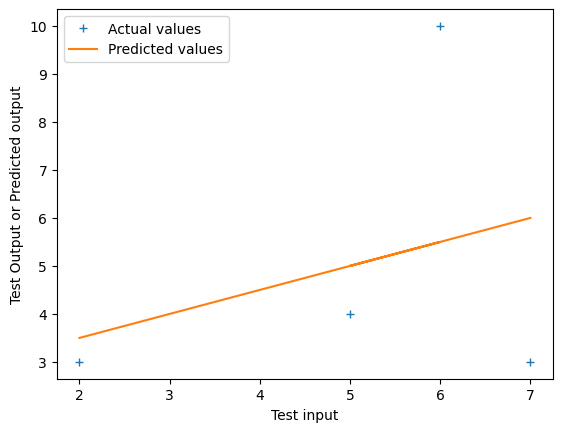

In [70]:
#Prediction on test data
y_pred = np.multiply(train_input, parameters['m'])+parameters['c']

# Plot the regression line with actual data pointa
plt.plot(train_input, train_output, '+', label='Actual values')
plt.plot(train_input, y_pred, label='Predicted values')
plt.xlabel('Test input')
plt.ylabel('Test Output or Predicted output')
plt.legend()
plt.show()


In [72]:
def linear_regression_normal_equation(X, y):
    X_transpose = np.transpose(X)
    X_transpose_X = np.dot(X_transpose, X)
    X_transpose_y = np.dot(X_transpose, y)
     
    try:
        theta = np.linalg.solve(X_transpose_X, X_transpose_y)
        return theta
    except np.linalg.LinAlgError:
        return None

In [90]:
# X = np.array([[1, 2, 5], [1,6,4], [1,5,2], [1,7,4]])
# y = np.array([3,10,4,3])
from sklearn.datasets import make_regression
X, y = make_regression(n_samples=100, n_features=2,
                       n_informative=1, noise=10, random_state=10)
X_with_intercept = np.c_[np.ones((X.shape[0], 1)), X]

theta = linear_regression_normal_equation(X_with_intercept, y)
if theta is not None:
    print(theta)
else:
    print("Unable to compute theta. The matrix X_transpose_X is singular.")

predictions = np.dot(X_with_intercept, theta)
print(predictions)

[ 0.96558326  1.05561314 85.2971472 ]
[  25.45560107  142.9838181    10.89847186  -19.36853242   26.17821206
   17.39237205  -95.24233329  -23.38561486  -49.31323329   -5.11115555
 -127.03482245   30.51217842  -31.05910387   30.89740837  119.31683458
  172.12948461   69.44299784   96.51111919  -21.5237899   126.45249821
  -11.77088108  -77.26006837   30.41806754   -0.93889643   73.01985331
 -120.94817634  -25.00329128  115.28841468  -89.02362923  -67.88827226
    8.97238545   49.01587495  -53.29011758   21.64334503   86.53716605
   95.70807945   98.5788835    23.80819362   56.91106609   11.78260053
  -28.2823981    40.97726414   22.54732676  -60.10954192   78.21287788
  -16.39660107   47.28978358  190.87966808   88.70455001   44.96540362
  -91.25943756  -22.41566815   53.20363751  -19.1897266   171.84097052
   88.35937729  -58.76852746   48.3816776  -157.59690576  112.78046283
   28.69231008 -103.82885659  -30.08324818  116.1727746   205.26722371
   62.66299328  -27.63258155   -6.51263

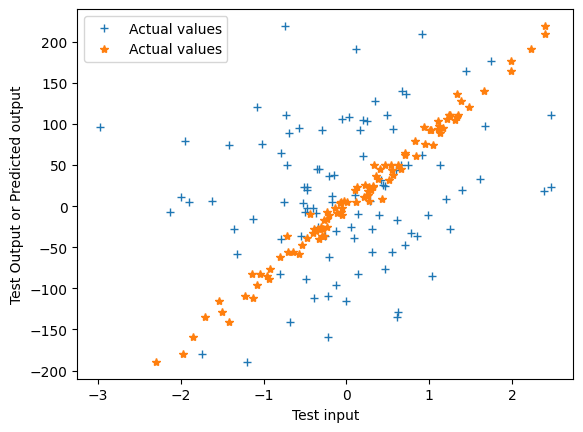

In [91]:


plt.plot(X[:,0], y, '+', label='Actual values')
plt.plot(X[:,1], y, '*', label='Actual values')
# plt.plot(X[:, 0], predictions, label='Predicted values')
plt.xlabel('Test input')
plt.ylabel('Test Output or Predicted output')
plt.legend()
plt.show()

In [92]:
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D

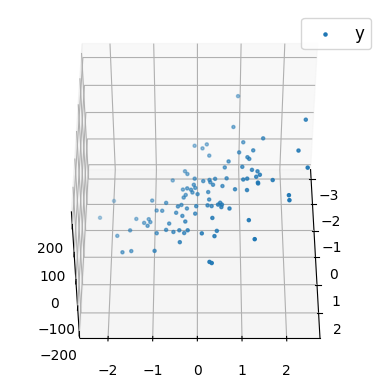

In [93]:
mpl.rcParams['legend.fontsize'] = 12
 
fig = plt.figure()
ax = fig.add_subplot(projection ='3d')
 
ax.scatter(X[:, 0], X[:, 1], y, label ='y', s = 5)
ax.legend()
ax.view_init(45, 0)
 
plt.show()